In [1]:
# Le dataset est automatiquement monté ici :
dataset_path = '/kaggle/input/ua-detrac-dataset/content/UA-DETRAC/DETRAC_Upload'

# Vérifier le contenu
import os
print("Contenu du dataset :")
print(os.listdir(dataset_path))

# Compter les fichiers
images_count = len([f for f in os.listdir(f"{dataset_path}/images/train") 
                   if f.endswith('.jpg')])
print(f"Images d'entraînement : {images_count}")

images_count = len([f for f in os.listdir(f"{dataset_path}/images/val") 
                   if f.endswith('.jpg')])
print(f"Images de test : {images_count}")

lables_count = len([f for f in os.listdir(f"{dataset_path}/labels/train") 
                   if f.endswith('.txt')])
print(f"lables d'entraînement : {lables_count}")

lables_count = len([f for f in os.listdir(f"{dataset_path}/labels/val") 
                   if f.endswith('.txt')])
print(f"lables de test : {lables_count}")

Contenu du dataset :
['labels', 'images']
Images d'entraînement : 83791
Images de test : 56340
lables d'entraînement : 82085
lables de test : 56167


In [2]:
!free -h

               total        used        free      shared  buff/cache   available
Mem:            31Gi       881Mi        27Gi       2.0Mi       3.0Gi        30Gi
Swap:             0B          0B          0B


In [3]:
# Voir la structure (instantané)
!ls -la /kaggle/working/

total 12
drwxr-xr-x 3 root root 4096 Jan 10 15:12 .
drwxr-xr-x 5 root root 4096 Jan 10 15:12 ..
drwxr-xr-x 2 root root 4096 Jan 10 15:13 .virtual_documents


In [4]:
!df -h /kaggle/working

Filesystem      Size  Used Avail Use% Mounted on
/dev/loop1       20G   88K   20G   1% /kaggle/working


In [5]:
# import os
# os.makedirs('/kaggle/working/ua_detrac', exist_ok=True)
# !cp -r /kaggle/input/ua-detrac-dataset/content/UA-DETRAC/DETRAC_Upload/images /kaggle/working/ua_detrac
# !cp -r /kaggle/input/ua-detrac-dataset/content/UA-DETRAC/DETRAC_Upload/labels /kaggle/working/ua_detrac

In [5]:
# print("Structure après copie :")
# !find /kaggle/working/ua_detrac -type f | head -20

In [8]:
import shutil
import os

# Chemin du dossier à supprimer
output_path = "/kaggle/working/ua_detrac_subset"

# Vérifier si le dossier existe avant de le supprimer
if os.path.exists(output_path):
    shutil.rmtree(output_path)
    print(f"Dossier '{output_path}' supprimé avec succès.")
else:
    print(f"Dossier '{output_path}' n'existe pas.")

Dossier '/kaggle/working/ua_detrac_subset' supprimé avec succès.


In [5]:
import os
import random
import shutil

MAX_IMAGES = 10000

base_path = "/kaggle/input/ua-detrac-dataset/content/UA-DETRAC/DETRAC_Upload"
subset_path = "/kaggle/working/ua_detrac_subset"

for split in ["train", "val"]:
    os.makedirs(f"{subset_path}/images/{split}", exist_ok=True)
    os.makedirs(f"{subset_path}/labels/{split}", exist_ok=True)

    images = os.listdir(f"{base_path}/images/{split}")
    images = random.sample(images, min(MAX_IMAGES, len(images)))

    for img in images:
        shutil.copy(
            f"{base_path}/images/{split}/{img}",
            f"{subset_path}/images/{split}/{img}"
        )

        label = img.replace(".jpg", ".txt")
        label_path = f"{base_path}/labels/{split}/{label}"
        if os.path.exists(label_path):
            shutil.copy(
                label_path,
                f"{subset_path}/labels/{split}/{label}"
            )

In [8]:
# Le dataset est automatiquement monté ici :
dataset_path = '/kaggle/working/ua_detrac_subset'

# Vérifier le contenu
import os
print("Contenu du dataset :")
print(os.listdir(dataset_path))

# Compter les fichiers
images_count = len([f for f in os.listdir(f"{dataset_path}/images/train") 
                   if f.endswith('.jpg')])
print(f"Images d'entraînement : {images_count}")

images_count = len([f for f in os.listdir(f"{dataset_path}/images/val") 
                   if f.endswith('.jpg')])
print(f"Images de test : {images_count}")

lables_count = len([f for f in os.listdir(f"{dataset_path}/labels/train") 
                   if f.endswith('.txt')])
print(f"lables d'entraînement : {lables_count}")

lables_count = len([f for f in os.listdir(f"{dataset_path}/labels/val") 
                   if f.endswith('.txt')])
print(f"lables de test : {lables_count}")

Contenu du dataset :
['labels', 'images']
Images d'entraînement : 10000
Images de test : 10000
lables d'entraînement : 9803
lables de test : 9971


In [9]:
missing_labels = 0

for img in os.listdir(f"{dataset_path}/images/train"):
    if img.endswith(".jpg"):
        label = img.replace(".jpg", ".txt")
        if not os.path.exists(f"{dataset_path}/labels/train/{label}"):
            missing_labels += 1

print("Images sans labels (train) :", missing_labels)


Images sans labels (train) : 197


In [10]:
missing_labels = 0

for img in os.listdir(f"{dataset_path}/images/val"):
    if img.endswith(".jpg"):
        label = img.replace(".jpg", ".txt")
        if not os.path.exists(f"{dataset_path}/labels/val/{label}"):
            missing_labels += 1

print("Images sans labels (train) :", missing_labels)


Images sans labels (train) : 29


In [11]:
!ls ua_detrac_subset

images	labels


In [12]:
import glob

label_files = glob.glob("ua_detrac_subset/labels/**/*.txt", recursive=True)

class_ids = set()

for file in label_files:
    with open(file, "r") as f:
        for line in f:
            if line.strip():
                class_id = int(line.split()[0])
                class_ids.add(class_id)

print("Class IDs found in dataset:", sorted(class_ids))
print("Nombre total de fichiers labels:", len(label_files))


Class IDs found in dataset: [0, 1, 2, 3]
Nombre total de fichiers labels: 19774


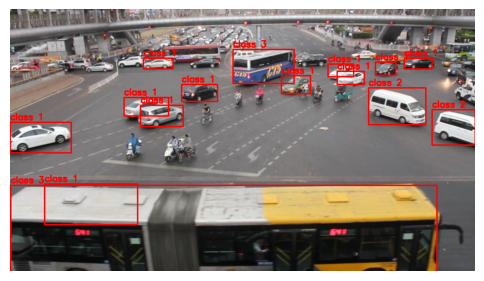

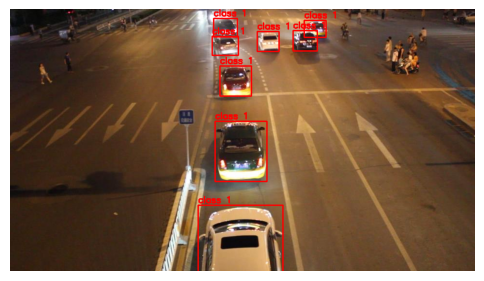

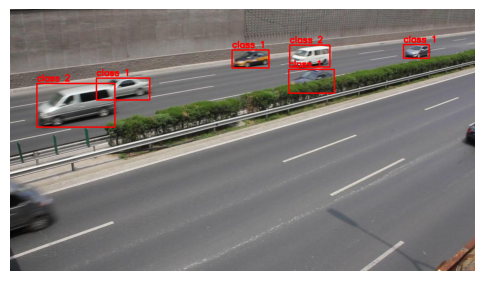

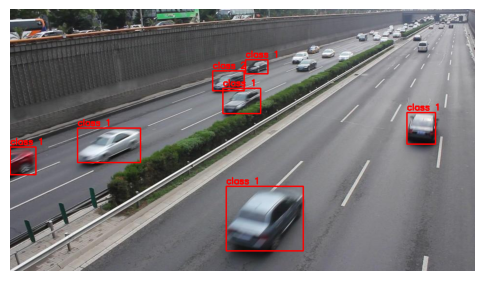

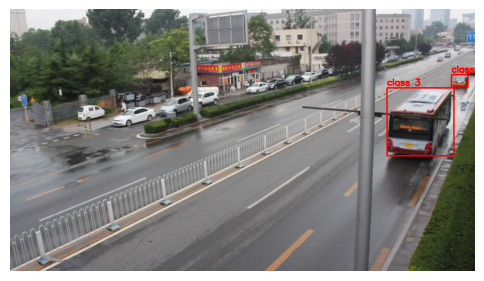

...

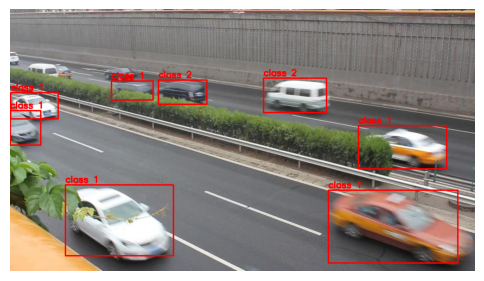

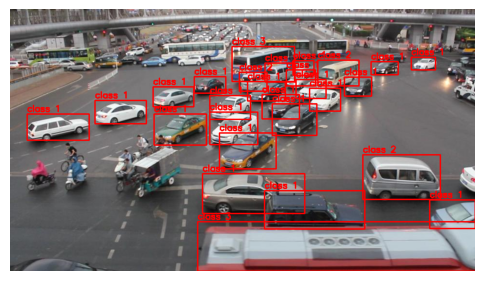

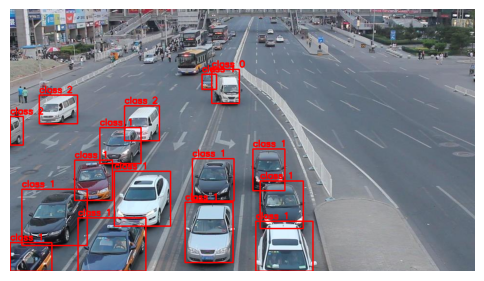

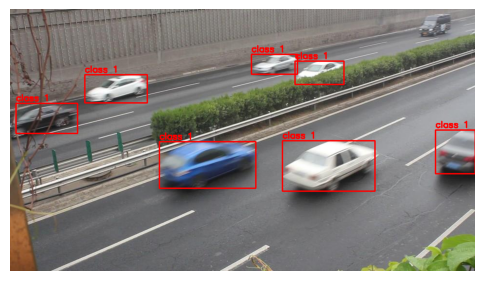

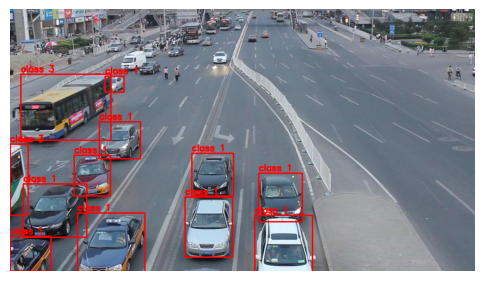

In [13]:
import cv2
import random
import matplotlib.pyplot as plt
import os

def show_random_samples(num_images=5):
    sample_labels = random.sample(label_files, num_images)

    for label_path in sample_labels:
        img_path = label_path.replace("labels", "images").replace(".txt", ".jpg")

        if not os.path.exists(img_path):
            continue

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        with open(label_path, "r") as f:
            for line in f:
                cls, x, y, bw, bh = map(float, line.split())

                x1 = int((x - bw/2) * w)
                y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w)
                y2 = int((y + bh/2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)
                cv2.putText(img, f"class {int(cls)}",
                            (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX,
                            0.6, (255,0,0), 2)

        plt.figure(figsize=(6,4))
        plt.imshow(img)
        plt.axis("off")
        plt.show()

show_random_samples(20)


In [14]:
import os

labels_dirs = [
    "/kaggle/working/ua_detrac_subset/labels/train",
    "/kaggle/working/ua_detrac_subset/labels/val"
]

for label_dir in labels_dirs:
    for file in os.listdir(label_dir):
        if not file.endswith(".txt"):
            continue
        
        path = os.path.join(label_dir, file)
        new_lines = []
        
        with open(path, "r") as f:
            for line in f:
                parts = line.strip().split()
                cls = int(parts[0])
                
                if cls == 0:      # truck
                    new_cls = 0
                elif cls in [1, 2]:  # car + van
                    new_cls = 1
                elif cls == 3:    # bus
                    new_cls = 2
                else:
                    continue  # ignore
                
                parts[0] = str(new_cls)
                new_lines.append(" ".join(parts))
        
        with open(path, "w") as f:
            f.write("\n".join(new_lines))


In [15]:
import glob

label_files = glob.glob("ua_detrac_subset/labels/**/*.txt", recursive=True)

class_ids = set()

for file in label_files:
    with open(file, "r") as f:
        for line in f:
            if line.strip():
                class_id = int(line.split()[0])
                class_ids.add(class_id)

print("Class IDs found in dataset:", sorted(class_ids))
print("Nombre total de fichiers labels:", len(label_files))


Class IDs found in dataset: [0, 1, 2]
Nombre total de fichiers labels: 19774


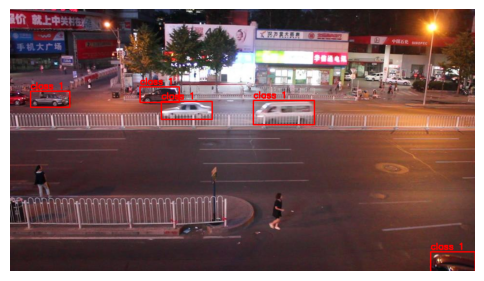

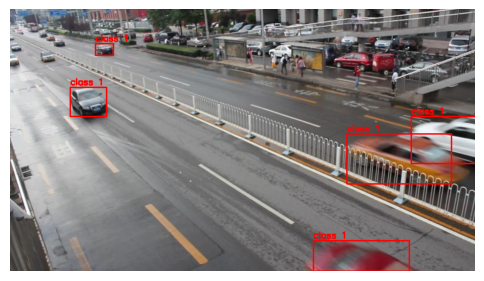

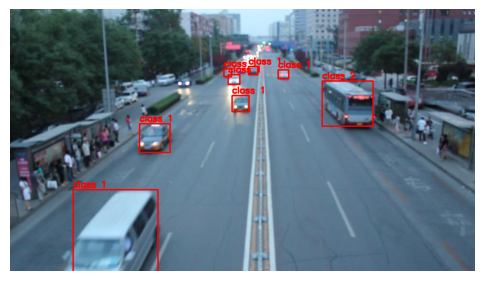

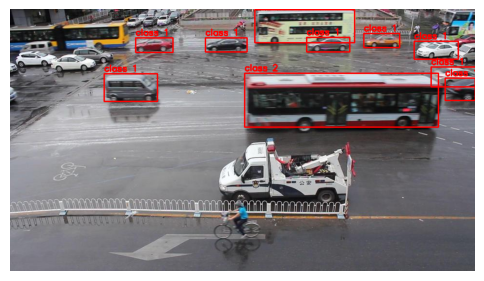

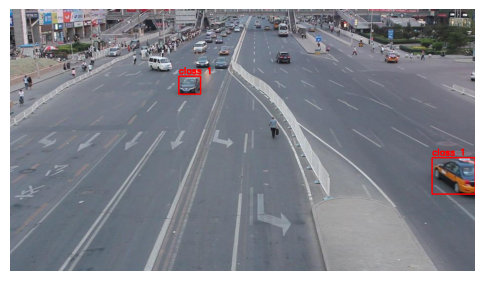

...

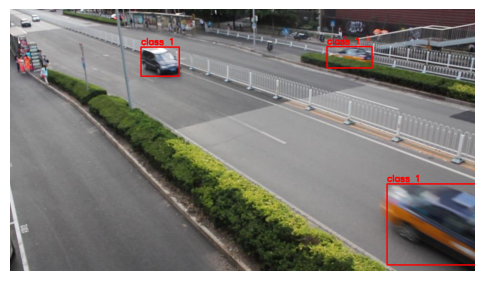

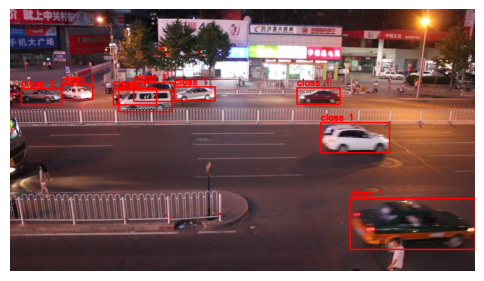

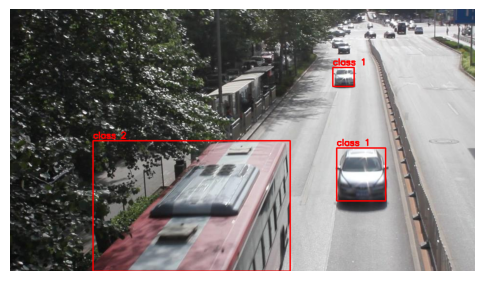

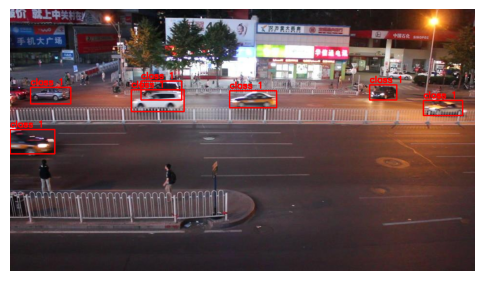

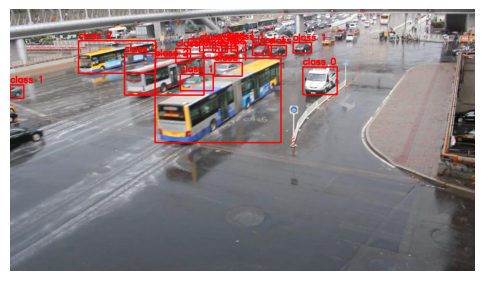

In [16]:
import cv2
import random
import matplotlib.pyplot as plt
import os

def show_random_samples(num_images=5):
    sample_labels = random.sample(label_files, num_images)

    for label_path in sample_labels:
        img_path = label_path.replace("labels", "images").replace(".txt", ".jpg")

        if not os.path.exists(img_path):
            continue

        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        with open(label_path, "r") as f:
            for line in f:
                cls, x, y, bw, bh = map(float, line.split())

                x1 = int((x - bw/2) * w)
                y1 = int((y - bh/2) * h)
                x2 = int((x + bw/2) * w)
                y2 = int((y + bh/2) * h)

                cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)
                cv2.putText(img, f"class {int(cls)}",
                            (x1, y1-5),
                            cv2.FONT_HERSHEY_SIMPLEX,
                            0.6, (255,0,0), 2)

        plt.figure(figsize=(6,4))
        plt.imshow(img)
        plt.axis("off")
        plt.show()

show_random_samples(20)


In [17]:
import os

DST_PATH = "/kaggle/working/ua_detrac_subset"
IMG_PATH = f"{DST_PATH}/images/train"
LBL_PATH = f"{DST_PATH}/labels/train"

images_without_labels = []

for img in os.listdir(IMG_PATH):
    if img.endswith(".jpg"):
        label = img.replace(".jpg", ".txt")
        if not os.path.exists(f"{LBL_PATH}/{label}"):
            images_without_labels.append(img)

print("Images sans label (train) :", len(images_without_labels))
images_without_labels[:10]


Images sans label (train) : 197


['MVI_39811_img00213.jpg',
 'MVI_39931_img00701.jpg',
 'MVI_39811_img00603.jpg',
 'MVI_39931_img00796.jpg',
 'MVI_40162_img00338.jpg',
 'MVI_63544_img01034.jpg',
 'MVI_39811_img00221.jpg',
 'MVI_39811_img00499.jpg',
 'MVI_39761_img00599.jpg',
 'MVI_39761_img01074.jpg']

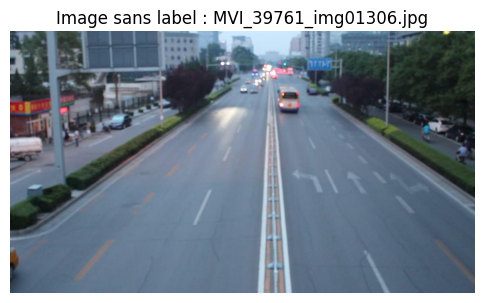

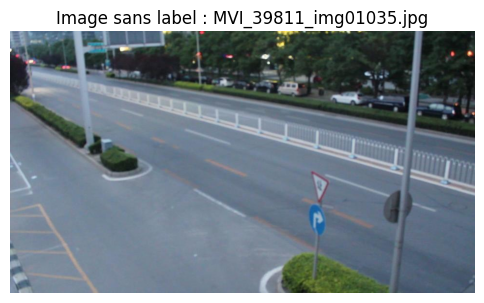

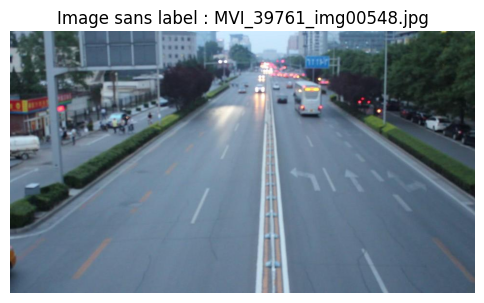

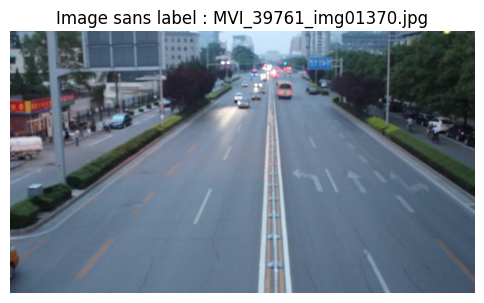

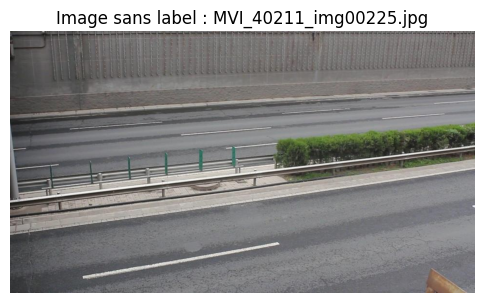

In [18]:
import cv2
import matplotlib.pyplot as plt
import random

sample_imgs = random.sample(images_without_labels, min(5, len(images_without_labels)))

for img_name in sample_imgs:
    img = cv2.imread(f"{IMG_PATH}/{img_name}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(6,4))
    plt.imshow(img)
    plt.title(f"Image sans label : {img_name}")
    plt.axis("off")
    plt.show()


In [19]:
missing_labels = 0

for img in os.listdir(f"{dataset_path}/images/val"):
    if img.endswith(".jpg"):
        label = img.replace(".jpg", ".txt")
        if not os.path.exists(f"{dataset_path}/labels/val/{label}"):
            missing_labels += 1

print("Images sans labels (train) :", missing_labels)


Images sans labels (train) : 29


In [20]:
import os

DST_PATH = "/kaggle/working/ua_detrac_subset"
IMG_PATH = f"{DST_PATH}/images/val"
LBL_PATH = f"{DST_PATH}/labels/val"

images_without_labels = []

for img in os.listdir(IMG_PATH):
    if img.endswith(".jpg"):
        label = img.replace(".jpg", ".txt")
        if not os.path.exists(f"{LBL_PATH}/{label}"):
            images_without_labels.append(img)

print("Images sans label (train) :", len(images_without_labels))
images_without_labels[:5]


Images sans label (train) : 29


['MVI_39051_img01029.jpg',
 'MVI_39211_img00478.jpg',
 'MVI_39051_img01020.jpg',
 'MVI_39211_img00570.jpg',
 'MVI_39051_img01027.jpg']

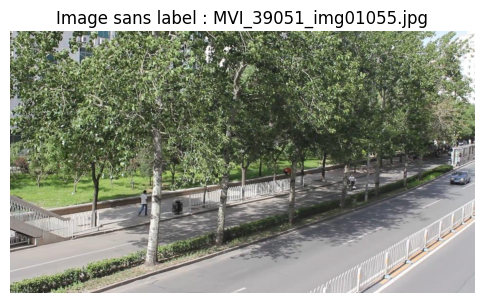

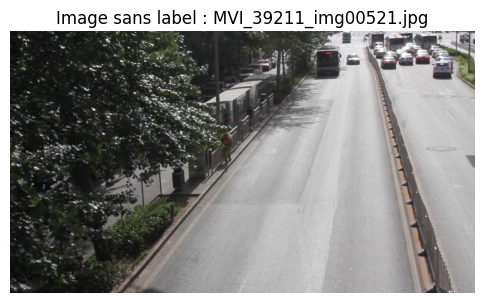

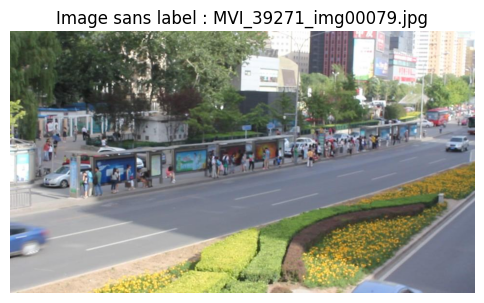

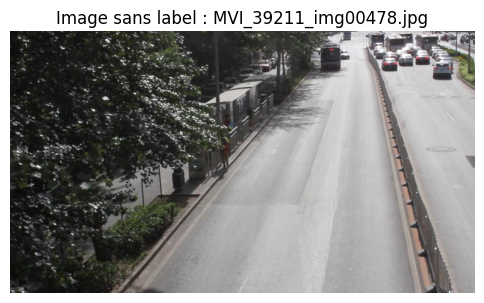

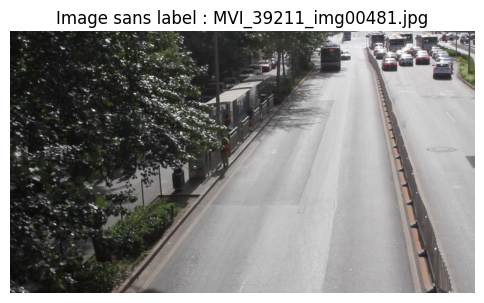

In [21]:
import cv2
import matplotlib.pyplot as plt
import random

sample_imgs = random.sample(images_without_labels, min(5, len(images_without_labels)))

for img_name in sample_imgs:
    img = cv2.imread(f"{IMG_PATH}/{img_name}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(6,4))
    plt.imshow(img)
    plt.title(f"Image sans label : {img_name}")
    plt.axis("off")
    plt.show()


In [ ]:
import os, random, shutil

SRC_PATH = "/kaggle/working/ua_detrac_subset"
DST_PATH = "/kaggle/working/ua_detrac_yolo"

MAX_IMAGES = 20000
TRAIN_RATIO = 0.7
VAL_RATIO = 0.2
TEST_RATIO = 0.1

# 1. Créer les répertoires de destination
for split in ["train", "val", "test"]:
    os.makedirs(f"{DST_PATH}/images/{split}", exist_ok=True)
    os.makedirs(f"{DST_PATH}/labels/{split}", exist_ok=True)

def collect_images_with_labels(split):
    """Collecte les images qui ont des annotations correspondantes"""
    images_with_labels = []
    images_dir = f"{SRC_PATH}/images/{split}"
    labels_dir = f"{SRC_PATH}/labels/{split}"
    
    # Vérifier si le dossier existe
    if not os.path.exists(images_dir):
        print(f"Dossier introuvable: {images_dir}")
        return images_with_labels
    
    # Lister toutes les images
    for img_file in os.listdir(images_dir):
        if img_file.endswith(".jpg"):
            img_path = f"{split}/{img_file}"
            
            # Vérifier si le label correspondant existe
            label_file = img_file.replace(".jpg", ".txt")
            label_path = os.path.join(labels_dir, label_file)
            
            if os.path.exists(label_path):
                images_with_labels.append(img_path)
            else:
                print(f"Label manquant pour: {img_file}")
    
    print(f"{split}: {len(images_with_labels)} images avec labels")
    return images_with_labels

# 2. Collecter toutes les images avec labels
all_images = []
for split in ["train", "val"]:  # Normalement, on n'a pas de "test" dans la source
    all_images.extend(collect_images_with_labels(split))

print(f"Total d'images avec labels: {len(all_images)}")

# 3. Limiter et mélanger
if MAX_IMAGES > 0:
    all_images = all_images[:MAX_IMAGES]
random.shuffle(all_images)

# 4. Répartir en train/val/test
total = len(all_images)
train_end = int(total * TRAIN_RATIO)
val_end = train_end + int(total * VAL_RATIO)

splits = {
    "train": all_images[:train_end],
    "val": all_images[train_end:val_end],
    "test": all_images[val_end:] if val_end < total else []
}

# 5. Copier les fichiers
for split, img_paths in splits.items():
    print(f"\nTraitement de {split} ({len(img_paths)} images)...")
    
    for img_path in img_paths:
        # Extraire le split d'origine et le nom du fichier
        if "/" in img_path:
            origin_split, img_file = img_path.split("/", 1)
        else:
            # Si pas de slash, tout est le nom du fichier
            origin_split = "train"  # Par défaut
            img_file = img_path
        
        # 1. Copier l'image
        src_img = f"{SRC_PATH}/images/{origin_split}/{img_file}"
        dst_img = f"{DST_PATH}/images/{split}/{img_file}"
        
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        else:
            print(f"Image introuvable: {src_img}")
            continue
        
        # 2. Copier le label correspondant
        label_file = img_file.replace(".jpg", ".txt")
        src_label = f"{SRC_PATH}/labels/{origin_split}/{label_file}"
        dst_label = f"{DST_PATH}/labels/{split}/{label_file}"
        
        if os.path.exists(src_label):
            shutil.copy(src_label, dst_label)
        else:
            print(f"Label introuvable: {src_label}")

print("\n" + "="*50)
print("Dataset YOLO prêt !")
print("="*50)
for s in splits:
    print(f"{s}: {len(splits[s])} images")

# 6. Vérification finale
print("\nVérification des dossiers:")
for split in ["train", "val", "test"]:
    images_count = len(os.listdir(f"{DST_PATH}/images/{split}"))
    labels_count = len(os.listdir(f"{DST_PATH}/labels/{split}"))
    print(f"{split}: {images_count} images, {labels_count} labels")

⚠️ Label manquant pour: MVI_39811_img00213.jpg
⚠️ Label manquant pour: MVI_39931_img00701.jpg
⚠️ Label manquant pour: MVI_39811_img00603.jpg
⚠️ Label manquant pour: MVI_39931_img00796.jpg
⚠️ Label manquant pour: MVI_40162_img00338.jpg
⚠️ Label manquant pour: MVI_63544_img01034.jpg
⚠️ Label manquant pour: MVI_39811_img00221.jpg
⚠️ Label manquant pour: MVI_39811_img00499.jpg
⚠️ Label manquant pour: MVI_39761_img00599.jpg
⚠️ Label manquant pour: MVI_39761_img01074.jpg
⚠️ Label manquant pour: MVI_39811_img00622.jpg
⚠️ Label manquant pour: MVI_39761_img00548.jpg
⚠️ Label manquant pour: MVI_39761_img00941.jpg
⚠️ Label manquant pour: MVI_40991_img00316.jpg
⚠️ Label manquant pour: MVI_40213_img01290.jpg
⚠️ Label manquant pour: MVI_63544_img00925.jpg
⚠️ Label manquant pour: MVI_39811_img00834.jpg
⚠️ Label manquant pour: MVI_40992_img01566.jpg
⚠️ Label manquant pour: MVI_39811_img01010.jpg
⚠️ Label manquant pour: MVI_39761_img01318.jpg
⚠️ Label manquant pour: MVI_63544_img00996.jpg
⚠️ Label manq

In [23]:
%%writefile data.yaml
path: /kaggle/working/ua_detrac_yolo

train: images/train
val: images/val
test: images/test

nc: 3
names:
  0: others
  1: car
  2: bus

Writing data.yaml


In [24]:
import torch

print("GPU disponible :", torch.cuda.is_available())
print("Nom du GPU :", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "Aucun GPU")


GPU disponible : True
Nom du GPU : Tesla T4


In [25]:
# Vérifier le GPU (instantané)
!nvidia-smi

Sat Jan 10 15:37:12 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.172.08             Driver Version: 570.172.08     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P8              9W /   70W |       3MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [26]:
!pip install -U ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 17.7 MB/s eta 0:00:00a 0:00:01


In [27]:
from ultralytics import YOLO
model = YOLO("yolov8s.pt")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
model.train(
    data="/kaggle/working/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    device=[0, 1],
    workers=4,
    project="runs",
    name="yolov8s_ua_detrac"
)

Ultralytics 8.3.251 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
                                                       CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s_ua_detrac, nbs=64, nms=False, opset=None, optimize

In [36]:
import shutil

shutil.make_archive(
    "/kaggle/working/yolo_result",
    "zip",
    "runs"
)

'/kaggle/working/yolo_result.zip'

In [36]:
import pandas as pd

df = pd.read_csv("runs/yolov8s_ua_detrac/results.csv")
df.tail()


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
95,96,15940.6,0.48818,0.23326,0.81793,0.98421,0.98045,0.99358,0.93348,0.53906,0.24517,0.82646,0.000595,0.000595,0.000595
96,97,16100.0,0.48828,0.23204,0.81934,0.98425,0.98056,0.99361,0.93358,0.53879,0.24512,0.82640,0.000496,0.000496,0.000496
97,98,16259.6,0.48276,0.22956,0.81707,0.98420,0.98078,0.99361,0.93362,0.53850,0.24495,0.82637,0.000397,0.000397,0.000397
98,99,16419.5,0.48177,0.22929,0.81732,0.98192,0.98275,0.99363,0.93374,0.53826,0.24475,0.82628,0.000298,0.000298,0.000298
99,100,16579.0,0.47676,0.22753,0.81501,0.98244,0.98219,0.99364,0.93402,0.53789,0.24451,0.82619,0.000199,0.000199,0.000199


📊 20 images trouvées dans /kaggle/working/runs/yolov8s_ua_detrac


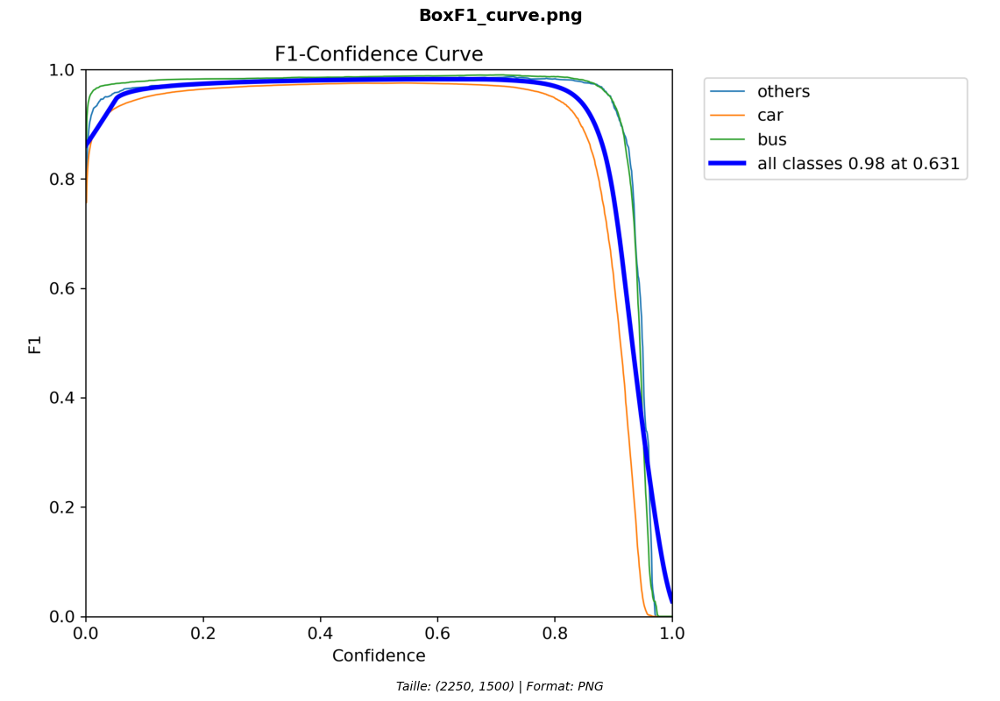

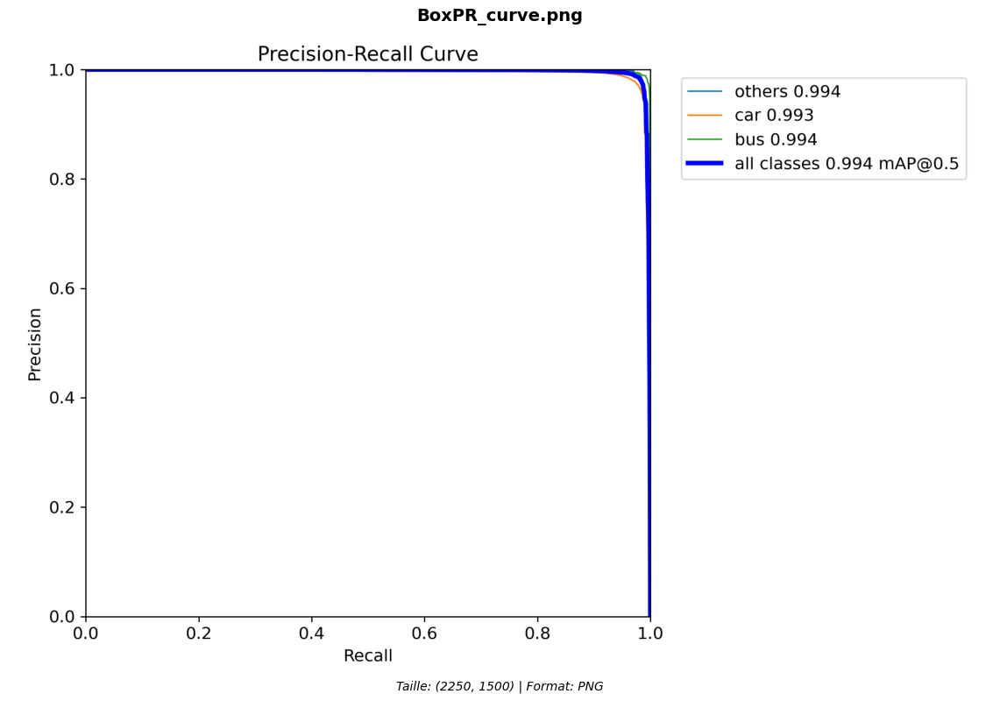

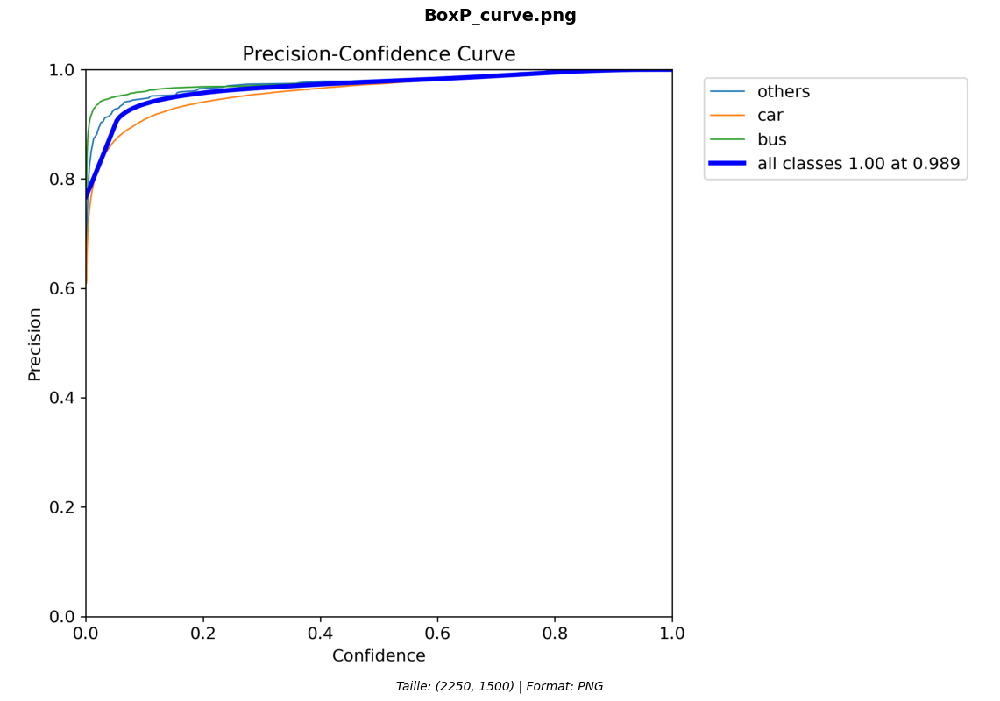

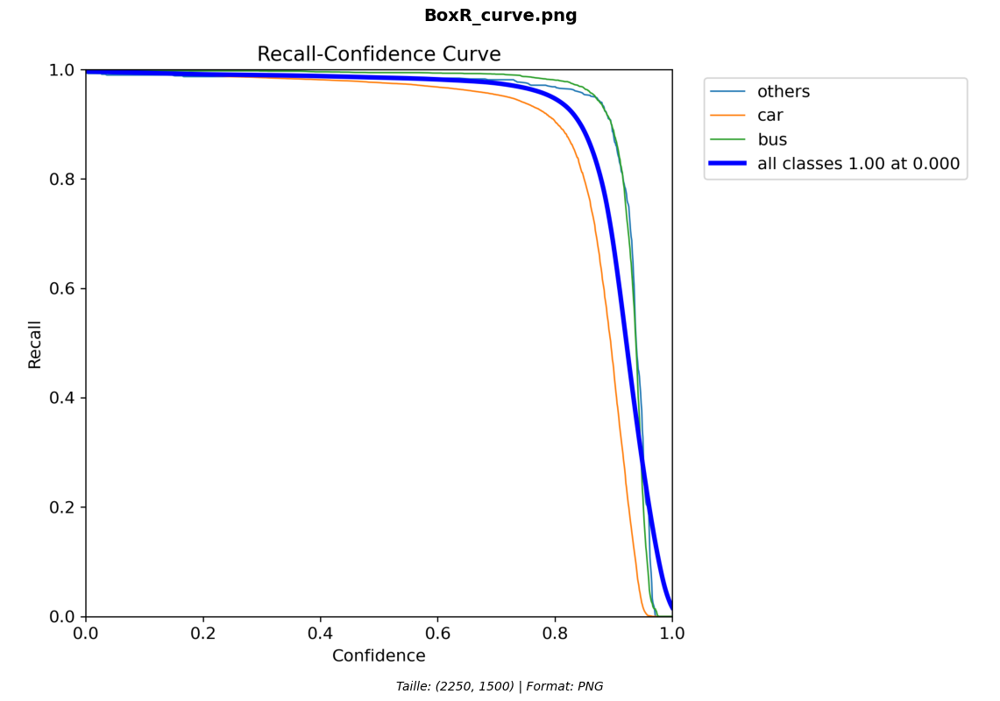

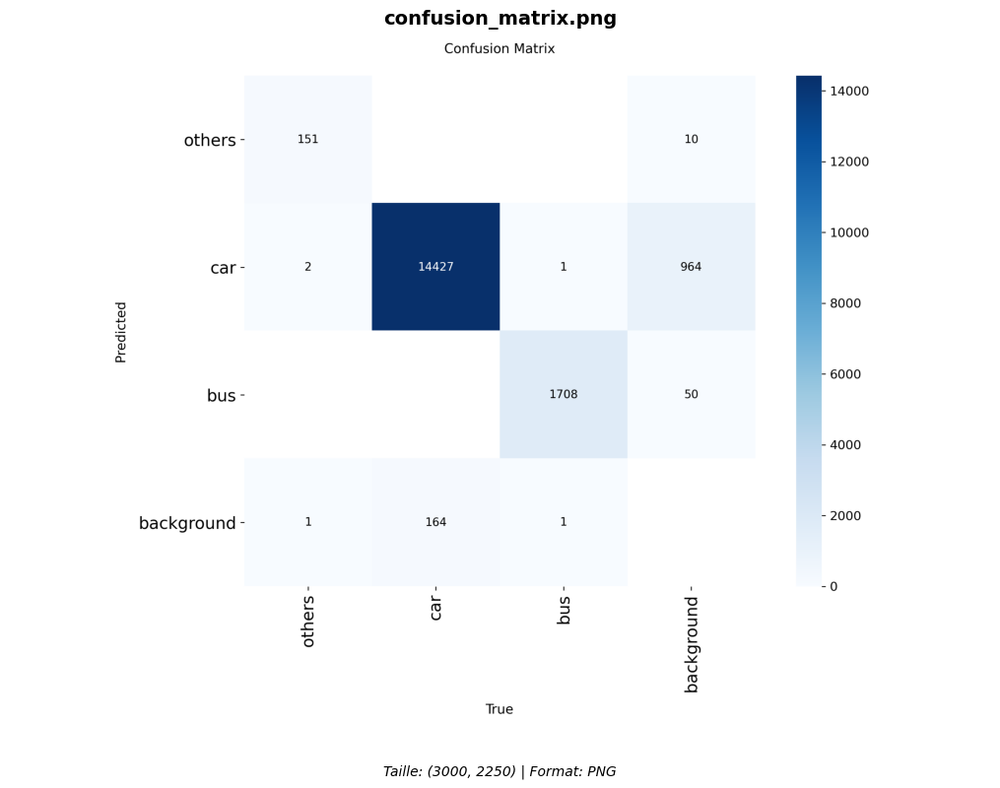

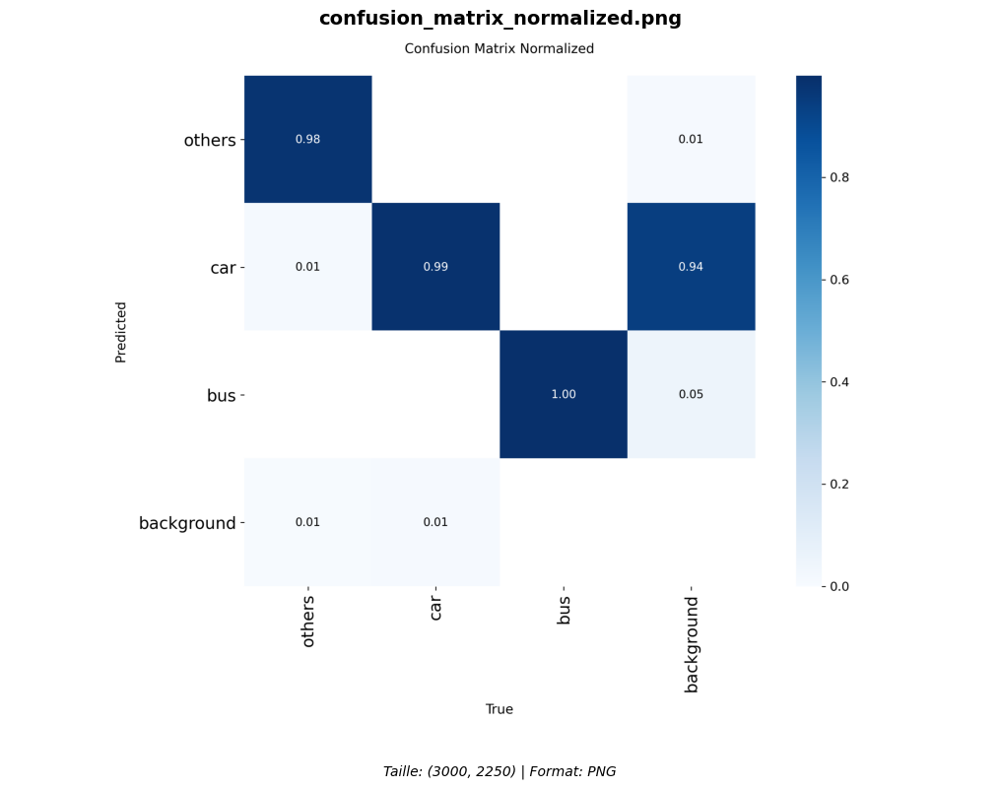

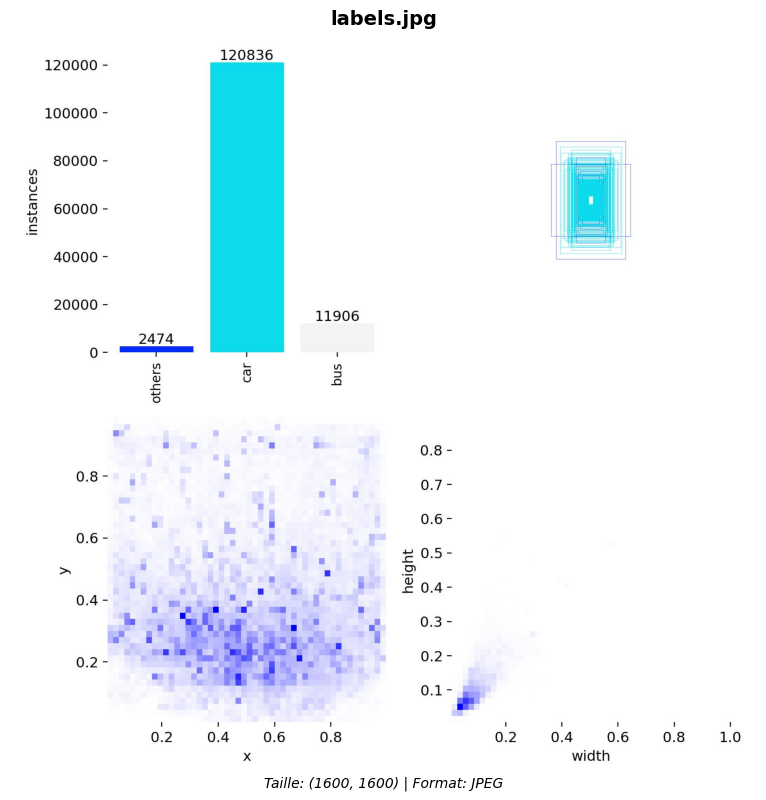

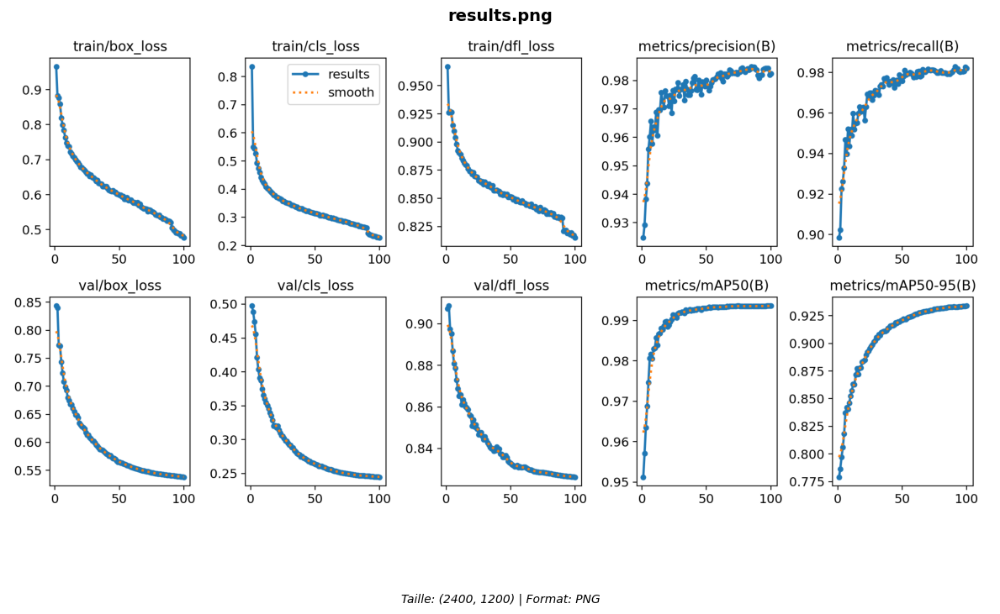

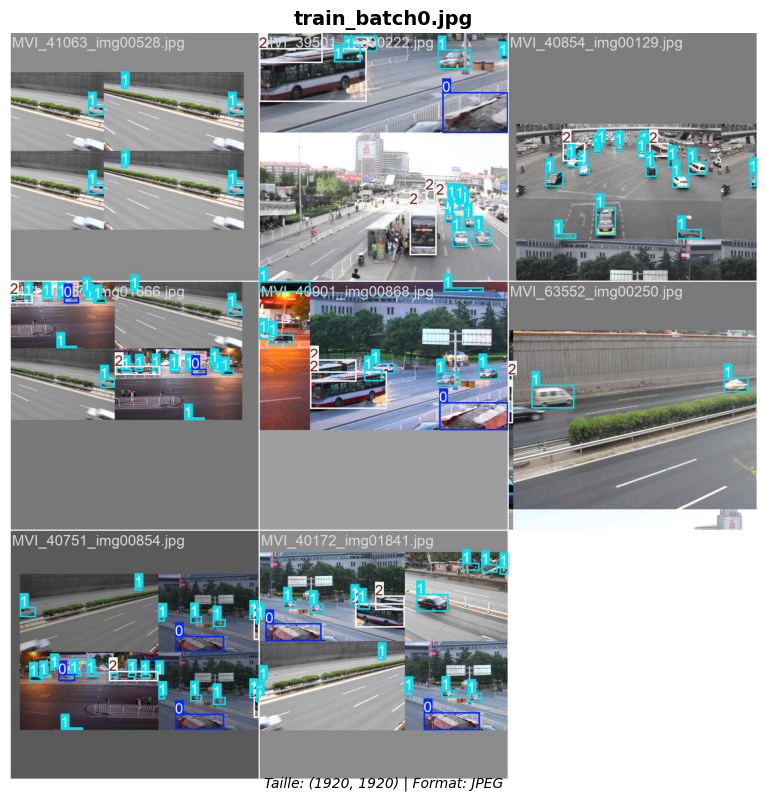

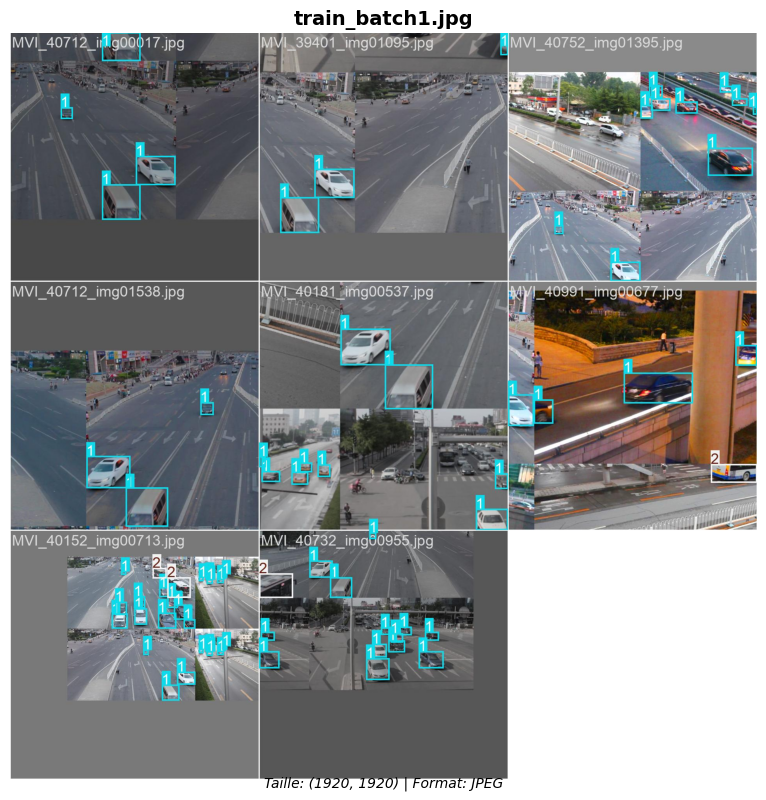

In [ ]:
import matplotlib.pyplot as plt
import os
from PIL import Image

resul_dir = "/kaggle/working/runs/yolov8s_ua_detrac"

# 1. Lister seulement les fichiers image
image_extensions = {'.png', '.jpg', '.jpeg', '.bmp', '.tiff', '.gif'}
imgs = [f for f in os.listdir(resul_dir) 
        if os.path.splitext(f)[1].lower() in image_extensions]

print(f"{len(imgs)} images trouvées dans {resul_dir}")

# 2. Trier par nom pour un affichage cohérent
imgs.sort()

# 3. Afficher les images
for i, img_name in enumerate(imgs[:10]):  # Limiter à 10 images max
    try:
        img_path = os.path.join(resul_dir, img_name)
        
        # Vérifier que c'est un fichier, pas un dossier
        if not os.path.isfile(img_path):
            print(f"{img_name} est un dossier, ignoré")
            continue
        
        # Lire et afficher l'image
        plt.figure(figsize=(12, 8))
        
        # Méthode 1: Avec PIL (meilleure gestion des formats)
        img = Image.open(img_path)
        plt.imshow(img)
        
        # Ou Méthode 2: Avec plt.imread
        # img = plt.imread(img_path)
        # plt.imshow(img)
        
        plt.title(f"{img_name}", fontsize=14, fontweight='bold')
        plt.axis("off")
        
        # Ajouter des informations
        plt.figtext(0.5, 0.01, f"Taille: {img.size if hasattr(img, 'size') else 'N/A'} | Format: {img.format if hasattr(img, 'format') else 'N/A'}", 
                   ha="center", fontsize=10, style='italic')
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Erreur avec {img_name}: {e}")

In [ ]:
from ultralytics import YOLO

model = YOLO("runs/yolov8s_ua_detrac/train/weights/best.pt")

results = model.predict(
    source="/kaggle/working/ua_detrac_yolo/images/test",
    save=True,
    conf=0.4
)

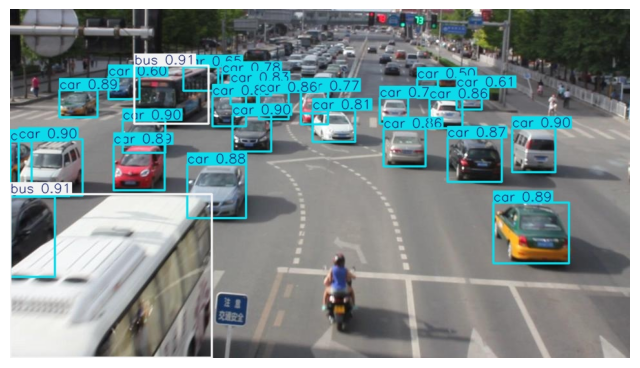

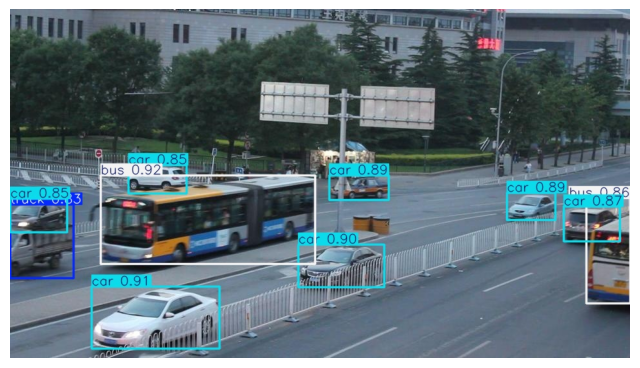

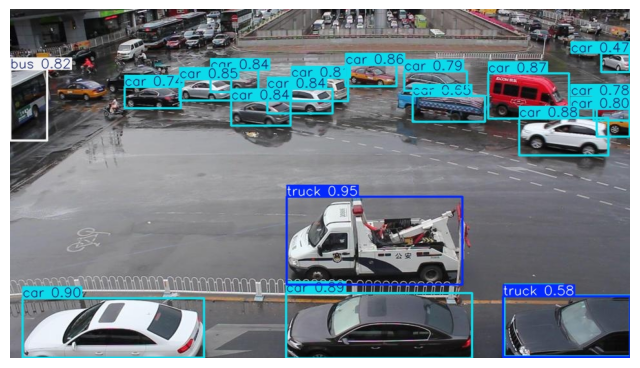

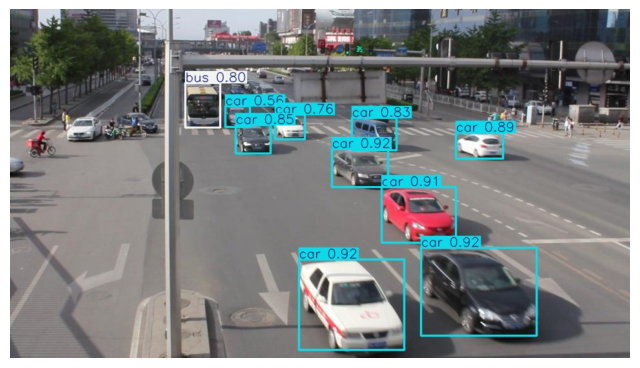

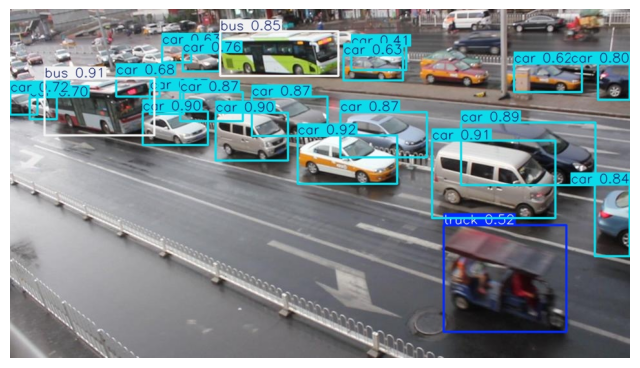

In [43]:
import matplotlib.pyplot as plt
import os

pred_dir = "/kaggle/working/runs/detect/predict"
imgs = os.listdir(pred_dir)[:5]

for img in imgs:
    plt.figure(figsize=(8,6))
    plt.imshow(plt.imread(os.path.join(pred_dir, img)))
    plt.axis("off")
    plt.show()